In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Feb_14_21:12:58_PST_2021
Cuda compilation tools, release 11.2, V11.2.152
Build cuda_11.2.r11.2/compiler.29618528_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [ ]:
!pip install mmcv-full

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 593 kB 4.8 MB/s 
     |████████████████████████████████| 190 kB 87.9 MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.7.0-cp38-cp38-linux_x86_64.whl size=28096870 sha256=b44231d5efce1cfca451e30ef114fea89c8ee3caa1d85d8ba70e91b51a98b25d
  Stored in directory: /root/.cache/pip/wheels/af/c2/d1/17f8254de688113bae94f7daf3a3dbe8a18be39dc46b9a45b6
Successfully built mmcv-full


In [ ]:
import torch
from mmcv import collect_env # MMLab CV engine

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(


In [ ]:
# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e . # requirements

Cloning into 'mmdetection'...
remote: Enumerating objects: 32840, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (147/147), done.
remote: Total 32840 (delta 32), reused 99 (delta 12), pack-reused 32680
Receiving objects: 100% (32840/32840), 44.96 MiB | 40.60 MiB/s, done.
Resolving deltas: 100% (23143/23143), done.
/content/mmdetection
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/mmdetection
  Running setup.py develop for mmdet


In [ ]:
collect_env()

{'sys.platform': 'linux',
 'Python': '3.8.16 (default, Dec  7 2022, 01:12:13) [GCC 7.5.0]',
 'CUDA available': True,
 'GPU 0': 'A100-SXM4-40GB',
 'CUDA_HOME': '/usr/local/cuda',
 'NVCC': 'Cuda compilation tools, release 11.2, V11.2.152',
 'GCC': 'x86_64-linux-gnu-gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0',
 'PyTorch': '1.13.0+cu116',
 'PyTorch compiling details': 'PyTorch built with:\n  - GCC 9.3\n  - C++ Version: 201402\n  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications\n  - Intel(R) MKL-DNN v2.6.0 (Git Hash 52b5f107dd9cf10910aaa19cb47f3abf9b349815)\n  - OpenMP 201511 (a.k.a. OpenMP 4.5)\n  - LAPACK is enabled (usually provided by MKL)\n  - NNPACK is enabled\n  - CPU capability usage: AVX2\n  - CUDA Runtime 11.6\n  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-gencode;arch=compute_60,code=sm_60;-gencode;arch=compute_70,code=sm_70;-gencode;arch=compute_75,code=sm_75;-gen

In [ ]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.13.0+cu116 True
2.26.0
11.2
GCC 7.5


In [ ]:
# We download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/dynamic_rcnn/dynamic_rcnn_r50_fpn_1x/dynamic_rcnn_r50_fpn_1x-62a3f276.pth \
      -O checkpoints/dynamic_rcnn_r50_fpn_1x-62a3f276.pth

--2022-12-14 02:53:27--  https://download.openmmlab.com/mmdetection/v2.0/dynamic_rcnn/dynamic_rcnn_r50_fpn_1x/dynamic_rcnn_r50_fpn_1x-62a3f276.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.252.96.15
Connecting to download.openmmlab.com (download.openmmlab.com)|47.252.96.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167290540 (160M) [application/octet-stream]
Saving to: ‘checkpoints/dynamic_rcnn_r50_fpn_1x-62a3f276.pth’

checkpoints/dynamic 100%[===================>] 159.54M  9.20MB/s    in 18s     

2022-12-14 02:53:46 (8.86 MB/s) - ‘checkpoints/dynamic_rcnn_r50_fpn_1x-62a3f276.pth’ saved [167290540/167290540]



In [ ]:
!ls checkpoints

dynamic_rcnn_r50_fpn_1x-62a3f276.pth


In [ ]:
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/dynamic_rcnn/dynamic_rcnn_r50_fpn_1x_coco.py'
# Setup a checkpoint file to load
checkpoint = 'checkpoints/dynamic_rcnn_r50_fpn_1x-62a3f276.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = config

# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

load checkpoint from local path: checkpoints/dynamic_rcnn_r50_fpn_1x-62a3f276.pth


FasterRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

# Inference

/content/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


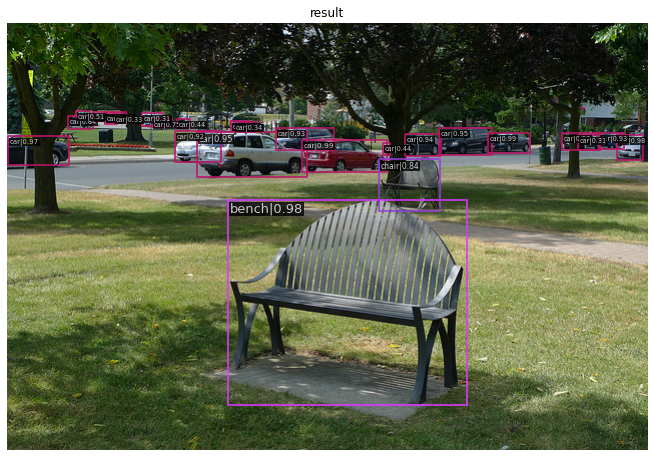

In [ ]:
# Use the detector to do inference on an included image.
img = 'demo/demo.jpg'
result = inference_detector(model, img)
show_result_pyplot(model, img, result, score_thr=0.3)

# Dataset and Configuration

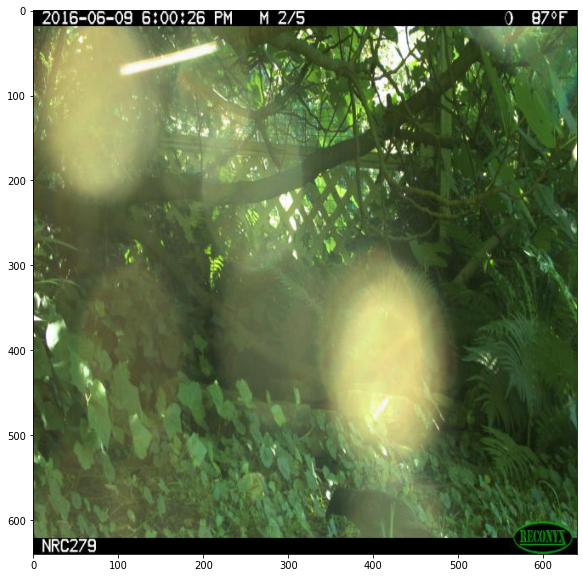

In [ ]:
# Let's take a look at a dataset image
import matplotlib.pyplot as plt

img = mmcv.imread('/content/drive/MyDrive/TMU/Project/Data/coco2yolo7.v1i.coco/valid/10_jpg.rf.1ed6e95e0b2ecfe5674674d3918c4be5.jpg')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/dynamic_rcnn/dynamic_rcnn_r50_fpn_1x_coco.py')

In [ ]:
!cat './configs/dynamic_rcnn/dynamic_rcnn_r50_fpn_1x_coco.py'

_base_ = '../faster_rcnn/faster_rcnn_r50_fpn_1x_coco.py'
model = dict(
    roi_head=dict(
        type='DynamicRoIHead',
        bbox_head=dict(
            type='Shared2FCBBoxHead',
            in_channels=256,
            fc_out_channels=1024,
            roi_feat_size=7,
            num_classes=80,
            bbox_coder=dict(
                type='DeltaXYWHBBoxCoder',
                target_means=[0., 0., 0., 0.],
                target_stds=[0.1, 0.1, 0.2, 0.2]),
            reg_class_agnostic=False,
            loss_cls=dict(
                type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0),
            loss_bbox=dict(type='SmoothL1Loss', beta=1.0, loss_weight=1.0))),
    train_cfg=dict(
        rpn_proposal=dict(nms=dict(iou_threshold=0.85)),
        rcnn=dict(
            dynamic_rcnn=dict(
                iou_topk=75,
                beta_topk=10,
                update_iter_interval=100,
                initial_iou=0.4,
                initial_beta=1.0))),
    test

Let's modify the config file for COCO.

In [ ]:
from mmdet.apis import set_random_seed
import json

# Number of Epochs
num_epochs = 15

# get some dataset info
with open('/content/drive/MyDrive/TMU/Project/Data/coco2yolo7.v1i.coco/train/_annotations.coco.json', 'r') as f:
  ena24 = json.load(f)

classes = tuple([category["name"] for category in ena24["categories"]])
num_classes = len(classes)

# Modify data (type and path (overall, train/val/test))
cfg.dataset_type = 'CocoDataset'
cfg.data_root = '/content/drive/MyDrive/TMU/Project/Data/coco2yolo7.v1i.coco/'
cfg.classes = classes

cfg.data.train.type = 'CocoDataset'
cfg.data.train.data_root = cfg.data_root + 'train/'
cfg.data.train.img_prefix = cfg.data.train.data_root
cfg.data.train.ann_file = cfg.data.train.data_root + '_annotations.coco.json'
cfg.data.train.classes = classes

cfg.data.val.type = 'CocoDataset'
cfg.data.val.data_root = cfg.data_root + 'valid/'
cfg.data.val.img_prefix = cfg.data.val.data_root
cfg.data.val.ann_file = cfg.data.val.data_root + '_annotations.coco.json'
cfg.data.val.classes = classes

cfg.data.test.type = 'CocoDataset'
cfg.data.test.data_root = cfg.data_root + 'test/'
cfg.data.test.img_prefix = cfg.data.test.data_root
cfg.data.test.ann_file = cfg.data.test.data_root + '_annotations.coco.json'
cfg.data.test.classes = classes

# Modify model
cfg.model.roi_head.bbox_head.num_classes = num_classes

cfg.load_from = 'checkpoints/dynamic_rcnn_r50_fpn_1x-62a3f276.pth' # where to get pretrained model
cfg.work_dir = './experiments' # for output

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]
cfg.device='cuda'

set_random_seed(0, deterministic=False)

# evaluation
cfg.evaluation.metric='bbox' # mAP not supported for COCO, but it is for VOC

# runner
cfg.runner.max_epochs = num_epochs

print(cfg.pretty_text)

model = dict(
    type='FasterRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=True,
        style='pytorch',
        init_cfg=dict(type='Pretrained', checkpoint='torchvision://resnet50')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='CrossEntropyLoss', use_sigmoid=True, loss_weight=1.

# Train

Train a new detector.

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
import os.path as osp

# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!


2022-12-14 06:18:37,455 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2022-12-14 06:18:37,481 - mmdet - INFO - load checkpoint from local path: checkpoints/dynamic_rcnn_r50_fpn_1x-62a3f276.pth
2022-12-14 06:18:37,607 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([24, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([24]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([92, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoint, the shape in current model is torch.Size([92]).
2022-12-14 06

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


2022-12-14 06:18:40,967 - mmdet - INFO - Epoch [1][10/3073]	lr: 2.500e-03, eta: 4:15:20, time: 0.332, data_time: 0.228, memory: 4686, loss_rpn_cls: 0.0156, loss_rpn_bbox: 0.0043, loss_cls: 1.3672, acc: 74.3945, loss_bbox: 0.2281, loss: 1.6152
2022-12-14 06:18:42,018 - mmdet - INFO - Epoch [1][20/3073]	lr: 2.500e-03, eta: 2:48:00, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0279, loss_rpn_bbox: 0.0048, loss_cls: 0.5856, acc: 89.6973, loss_bbox: 0.2394, loss: 0.8577
2022-12-14 06:18:43,056 - mmdet - INFO - Epoch [1][30/3073]	lr: 2.500e-03, eta: 2:18:34, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0300, loss_rpn_bbox: 0.0067, loss_cls: 0.4396, acc: 91.3379, loss_bbox: 0.2104, loss: 0.6867
2022-12-14 06:18:44,100 - mmdet - INFO - Epoch [1][40/3073]	lr: 2.500e-03, eta: 2:03:55, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0238, loss_rpn_bbox: 0.0091, loss_cls: 0.4141, acc: 91.0742, loss_bbox: 0.1956, loss: 0.6426
2022-12-14 06:18:45,147 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.3 task/s, elapsed: 62s, ETA:     0s

2022-12-14 06:25:01,024 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.74s).
Accumulating evaluation results...


2022-12-14 06:25:05,065 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.365
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.610
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.400
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.130
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.243
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.423
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.599
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.599
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.599
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.482
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.96s).


2022-12-14 06:25:08,479 - mmdet - INFO - Epoch [2][10/3073]	lr: 2.500e-03, eta: 1:15:19, time: 0.332, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0064, loss_rpn_bbox: 0.0033, loss_cls: 0.1916, acc: 93.7305, loss_bbox: 0.1179, loss: 0.3192
2022-12-14 06:25:09,521 - mmdet - INFO - Epoch [2][20/3073]	lr: 2.500e-03, eta: 1:15:18, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0048, loss_rpn_bbox: 0.0045, loss_cls: 0.2358, acc: 92.9590, loss_bbox: 0.1649, loss: 0.4100
2022-12-14 06:25:10,580 - mmdet - INFO - Epoch [2][30/3073]	lr: 2.500e-03, eta: 1:15:17, time: 0.106, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0015, loss_rpn_bbox: 0.0035, loss_cls: 0.2401, acc: 92.6465, loss_bbox: 0.1283, loss: 0.3735
2022-12-14 06:25:11,631 - mmdet - INFO - Epoch [2][40/3073]	lr: 2.500e-03, eta: 1:15:16, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0023, loss_rpn_bbox: 0.0053, loss_cls: 0.1833, acc: 94.1504, loss_bbox: 0.1636, loss: 0.3545
2022-12-14 06:25:12,715 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.4 task/s, elapsed: 62s, ETA:     0s

2022-12-14 06:31:28,794 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.26s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.08s).
Accumulating evaluation results...


2022-12-14 06:31:31,864 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.486
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.763
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.578
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.150
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.392
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.527
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.183
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.528
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.69s).


2022-12-14 06:31:35,181 - mmdet - INFO - Epoch [3][10/3073]	lr: 2.500e-03, eta: 1:09:45, time: 0.325, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0018, loss_rpn_bbox: 0.0062, loss_cls: 0.2436, acc: 92.7930, loss_bbox: 0.1675, loss: 0.4191
2022-12-14 06:31:36,230 - mmdet - INFO - Epoch [3][20/3073]	lr: 2.500e-03, eta: 1:09:43, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0020, loss_rpn_bbox: 0.0035, loss_cls: 0.1403, acc: 95.2051, loss_bbox: 0.0986, loss: 0.2444
2022-12-14 06:31:37,245 - mmdet - INFO - Epoch [3][30/3073]	lr: 2.500e-03, eta: 1:09:42, time: 0.101, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0084, loss_rpn_bbox: 0.0047, loss_cls: 0.1808, acc: 92.9199, loss_bbox: 0.1267, loss: 0.3207
2022-12-14 06:31:38,276 - mmdet - INFO - Epoch [3][40/3073]	lr: 2.500e-03, eta: 1:09:41, time: 0.103, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0027, loss_rpn_bbox: 0.0045, loss_cls: 0.2232, acc: 93.6621, loss_bbox: 0.1377, loss: 0.3681
2022-12-14 06:31:39,298 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.1 task/s, elapsed: 62s, ETA:     0s

2022-12-14 06:37:56,417 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.87s).
Accumulating evaluation results...


2022-12-14 06:37:58,970 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.547
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.839
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.664
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.292
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.418
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.612
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.659
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.659
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.659
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.378
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.529
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.63s).


2022-12-14 06:38:02,304 - mmdet - INFO - Epoch [4][10/3073]	lr: 2.500e-03, eta: 1:04:20, time: 0.327, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0015, loss_rpn_bbox: 0.0046, loss_cls: 0.1340, acc: 95.5176, loss_bbox: 0.1121, loss: 0.2522
2022-12-14 06:38:03,342 - mmdet - INFO - Epoch [4][20/3073]	lr: 2.500e-03, eta: 1:04:19, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0089, loss_rpn_bbox: 0.0037, loss_cls: 0.1529, acc: 94.9023, loss_bbox: 0.1149, loss: 0.2804
2022-12-14 06:38:04,361 - mmdet - INFO - Epoch [4][30/3073]	lr: 2.500e-03, eta: 1:04:18, time: 0.102, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0093, loss_rpn_bbox: 0.0047, loss_cls: 0.2131, acc: 92.4414, loss_bbox: 0.1007, loss: 0.3279
2022-12-14 06:38:05,410 - mmdet - INFO - Epoch [4][40/3073]	lr: 2.500e-03, eta: 1:04:17, time: 0.105, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0010, loss_rpn_bbox: 0.0043, loss_cls: 0.1511, acc: 94.2676, loss_bbox: 0.1199, loss: 0.2762
2022-12-14 06:38:06,455 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.0 task/s, elapsed: 63s, ETA:     0s

2022-12-14 06:44:24,139 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.51s).
Accumulating evaluation results...


2022-12-14 06:44:26,157 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.591
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.873
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.714
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.304
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.448
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.655
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.677
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.677
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.677
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.324
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.536
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.47s).


2022-12-14 06:44:29,504 - mmdet - INFO - Epoch [5][10/3073]	lr: 2.500e-03, eta: 0:58:59, time: 0.330, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0008, loss_rpn_bbox: 0.0025, loss_cls: 0.1169, acc: 95.9863, loss_bbox: 0.1210, loss: 0.2412
2022-12-14 06:44:30,558 - mmdet - INFO - Epoch [5][20/3073]	lr: 2.500e-03, eta: 0:58:58, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0021, loss_cls: 0.0965, acc: 96.6309, loss_bbox: 0.0813, loss: 0.1801
2022-12-14 06:44:31,611 - mmdet - INFO - Epoch [5][30/3073]	lr: 2.500e-03, eta: 0:58:57, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0038, loss_cls: 0.1188, acc: 96.2207, loss_bbox: 0.0843, loss: 0.2072
2022-12-14 06:44:32,645 - mmdet - INFO - Epoch [5][40/3073]	lr: 2.500e-03, eta: 0:58:55, time: 0.103, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0009, loss_rpn_bbox: 0.0026, loss_cls: 0.1743, acc: 94.1309, loss_bbox: 0.0996, loss: 0.2775
2022-12-14 06:44:33,685 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.0 task/s, elapsed: 63s, ETA:     0s

2022-12-14 06:50:50,880 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.27s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.76s).
Accumulating evaluation results...


2022-12-14 06:50:53,503 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.598
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.900
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.721
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.314
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.483
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.657
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.683
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.683
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.683
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.584
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.55s).


2022-12-14 06:50:56,847 - mmdet - INFO - Epoch [6][10/3073]	lr: 2.500e-03, eta: 0:53:36, time: 0.329, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0025, loss_rpn_bbox: 0.0043, loss_cls: 0.0707, acc: 97.3633, loss_bbox: 0.0974, loss: 0.1750
2022-12-14 06:50:57,908 - mmdet - INFO - Epoch [6][20/3073]	lr: 2.500e-03, eta: 0:53:35, time: 0.106, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0009, loss_rpn_bbox: 0.0030, loss_cls: 0.0728, acc: 97.3730, loss_bbox: 0.1067, loss: 0.1835
2022-12-14 06:50:58,964 - mmdet - INFO - Epoch [6][30/3073]	lr: 2.500e-03, eta: 0:53:34, time: 0.106, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0006, loss_rpn_bbox: 0.0036, loss_cls: 0.0798, acc: 97.1582, loss_bbox: 0.1055, loss: 0.1895
2022-12-14 06:51:00,032 - mmdet - INFO - Epoch [6][40/3073]	lr: 2.500e-03, eta: 0:53:33, time: 0.107, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0011, loss_rpn_bbox: 0.0054, loss_cls: 0.1060, acc: 96.4258, loss_bbox: 0.0889, loss: 0.2015
2022-12-14 06:51:01,061 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 27.9 task/s, elapsed: 63s, ETA:     0s

2022-12-14 06:57:20,210 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.59s).
Accumulating evaluation results...


2022-12-14 06:57:22,335 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.624
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.906
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.746
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.256
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.508
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.681
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.701
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.701
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.701
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.281
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.591
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.50s).


2022-12-14 06:57:25,665 - mmdet - INFO - Epoch [7][10/3073]	lr: 2.500e-03, eta: 0:48:16, time: 0.327, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0044, loss_rpn_bbox: 0.0045, loss_cls: 0.0929, acc: 96.4453, loss_bbox: 0.0957, loss: 0.1975
2022-12-14 06:57:26,715 - mmdet - INFO - Epoch [7][20/3073]	lr: 2.500e-03, eta: 0:48:15, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0029, loss_cls: 0.0829, acc: 96.7285, loss_bbox: 0.0686, loss: 0.1548
2022-12-14 06:57:27,780 - mmdet - INFO - Epoch [7][30/3073]	lr: 2.500e-03, eta: 0:48:14, time: 0.106, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0018, loss_rpn_bbox: 0.0042, loss_cls: 0.0841, acc: 96.6602, loss_bbox: 0.0837, loss: 0.1738
2022-12-14 06:57:28,829 - mmdet - INFO - Epoch [7][40/3073]	lr: 2.500e-03, eta: 0:48:13, time: 0.105, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0075, loss_rpn_bbox: 0.0039, loss_cls: 0.1010, acc: 97.2168, loss_bbox: 0.0730, loss: 0.1853
2022-12-14 06:57:29,882 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.5 task/s, elapsed: 62s, ETA:     0s

2022-12-14 07:03:47,749 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.53s).
Accumulating evaluation results...


2022-12-14 07:03:49,762 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.622
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.913
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.747
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.330
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.516
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.667
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.698
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.392
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.604
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.45s).


2022-12-14 07:03:53,103 - mmdet - INFO - Epoch [8][10/3073]	lr: 2.500e-03, eta: 0:42:55, time: 0.329, data_time: 0.228, memory: 4686, loss_rpn_cls: 0.0006, loss_rpn_bbox: 0.0023, loss_cls: 0.0614, acc: 97.6074, loss_bbox: 0.0878, loss: 0.1521
2022-12-14 07:03:54,153 - mmdet - INFO - Epoch [8][20/3073]	lr: 2.500e-03, eta: 0:42:54, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0031, loss_cls: 0.0690, acc: 97.6270, loss_bbox: 0.0869, loss: 0.1592
2022-12-14 07:03:55,202 - mmdet - INFO - Epoch [8][30/3073]	lr: 2.500e-03, eta: 0:42:53, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0009, loss_rpn_bbox: 0.0028, loss_cls: 0.0603, acc: 97.5000, loss_bbox: 0.0915, loss: 0.1556
2022-12-14 07:03:56,233 - mmdet - INFO - Epoch [8][40/3073]	lr: 2.500e-03, eta: 0:42:52, time: 0.103, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0008, loss_rpn_bbox: 0.0038, loss_cls: 0.1074, acc: 96.2891, loss_bbox: 0.0804, loss: 0.1924
2022-12-14 07:03:57,262 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.2 task/s, elapsed: 62s, ETA:     0s

2022-12-14 07:10:16,030 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.59s).
Accumulating evaluation results...


2022-12-14 07:10:18,109 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.641
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.925
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.770
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.333
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.531
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.700
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.714
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.714
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.714
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.608
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.46s).


2022-12-14 07:10:21,419 - mmdet - INFO - Epoch [9][10/3073]	lr: 2.500e-04, eta: 0:37:35, time: 0.326, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0002, loss_rpn_bbox: 0.0023, loss_cls: 0.0492, acc: 98.2617, loss_bbox: 0.0672, loss: 0.1189
2022-12-14 07:10:22,456 - mmdet - INFO - Epoch [9][20/3073]	lr: 2.500e-04, eta: 0:37:33, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0009, loss_rpn_bbox: 0.0029, loss_cls: 0.0434, acc: 98.3594, loss_bbox: 0.0658, loss: 0.1130
2022-12-14 07:10:23,490 - mmdet - INFO - Epoch [9][30/3073]	lr: 2.500e-04, eta: 0:37:32, time: 0.104, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0027, loss_rpn_bbox: 0.0027, loss_cls: 0.0761, acc: 97.9004, loss_bbox: 0.0511, loss: 0.1327
2022-12-14 07:10:24,531 - mmdet - INFO - Epoch [9][40/3073]	lr: 2.500e-04, eta: 0:37:31, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0010, loss_rpn_bbox: 0.0024, loss_cls: 0.0590, acc: 97.9492, loss_bbox: 0.0741, loss: 0.1365
2022-12-14 07:10:25,611 - mm

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 27.8 task/s, elapsed: 63s, ETA:     0s

2022-12-14 07:16:43,768 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.04s).
Accumulating evaluation results...


2022-12-14 07:16:45,211 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.691
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.939
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.828
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.410
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.576
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.759
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.747
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.747
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.747
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.434
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.634
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.38s).


2022-12-14 07:16:48,582 - mmdet - INFO - Epoch [10][10/3073]	lr: 2.500e-04, eta: 0:32:12, time: 0.333, data_time: 0.228, memory: 4686, loss_rpn_cls: 0.0006, loss_rpn_bbox: 0.0030, loss_cls: 0.0461, acc: 98.1934, loss_bbox: 0.0491, loss: 0.0988
2022-12-14 07:16:49,627 - mmdet - INFO - Epoch [10][20/3073]	lr: 2.500e-04, eta: 0:32:11, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0002, loss_rpn_bbox: 0.0026, loss_cls: 0.0332, acc: 98.6816, loss_bbox: 0.0419, loss: 0.0780
2022-12-14 07:16:50,664 - mmdet - INFO - Epoch [10][30/3073]	lr: 2.500e-04, eta: 0:32:10, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0009, loss_rpn_bbox: 0.0018, loss_cls: 0.0334, acc: 98.6230, loss_bbox: 0.0324, loss: 0.0685
2022-12-14 07:16:51,705 - mmdet - INFO - Epoch [10][40/3073]	lr: 2.500e-04, eta: 0:32:09, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0007, loss_rpn_bbox: 0.0022, loss_cls: 0.0420, acc: 98.2324, loss_bbox: 0.0414, loss: 0.0862
2022-12-14 07:16:52,763 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 27.9 task/s, elapsed: 63s, ETA:     0s

2022-12-14 07:23:10,772 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.36s).
Accumulating evaluation results...


2022-12-14 07:23:12,543 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.695
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.938
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.841
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.403
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.582
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.761
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.750
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.750
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.750
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.426
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.639
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.38s).


2022-12-14 07:23:15,905 - mmdet - INFO - Epoch [11][10/3073]	lr: 2.500e-04, eta: 0:26:50, time: 0.332, data_time: 0.229, memory: 4686, loss_rpn_cls: 0.0014, loss_rpn_bbox: 0.0022, loss_cls: 0.0415, acc: 98.4082, loss_bbox: 0.0464, loss: 0.0915
2022-12-14 07:23:16,962 - mmdet - INFO - Epoch [11][20/3073]	lr: 2.500e-04, eta: 0:26:49, time: 0.106, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0004, loss_rpn_bbox: 0.0020, loss_cls: 0.0349, acc: 98.5449, loss_bbox: 0.0421, loss: 0.0794
2022-12-14 07:23:17,993 - mmdet - INFO - Epoch [11][30/3073]	lr: 2.500e-04, eta: 0:26:47, time: 0.103, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0004, loss_rpn_bbox: 0.0029, loss_cls: 0.0531, acc: 97.7832, loss_bbox: 0.0584, loss: 0.1148
2022-12-14 07:23:19,032 - mmdet - INFO - Epoch [11][40/3073]	lr: 2.500e-04, eta: 0:26:46, time: 0.104, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0002, loss_rpn_bbox: 0.0018, loss_cls: 0.0407, acc: 98.2422, loss_bbox: 0.0437, loss: 0.0865
2022-12-14 07:23:20,057 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.0 task/s, elapsed: 63s, ETA:     0s

2022-12-14 07:29:38,703 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.02s).
Accumulating evaluation results...


2022-12-14 07:29:40,116 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.942
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.834
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.382
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.589
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.762
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.403
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.647
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.37s).


2022-12-14 07:29:43,442 - mmdet - INFO - Epoch [12][10/3073]	lr: 2.500e-05, eta: 0:21:28, time: 0.328, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0018, loss_rpn_bbox: 0.0019, loss_cls: 0.0592, acc: 98.4668, loss_bbox: 0.0320, loss: 0.0948
2022-12-14 07:29:44,477 - mmdet - INFO - Epoch [12][20/3073]	lr: 2.500e-05, eta: 0:21:27, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0024, loss_cls: 0.0361, acc: 98.5645, loss_bbox: 0.0380, loss: 0.0770
2022-12-14 07:29:45,511 - mmdet - INFO - Epoch [12][30/3073]	lr: 2.500e-05, eta: 0:21:25, time: 0.103, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0027, loss_cls: 0.0407, acc: 98.3008, loss_bbox: 0.0562, loss: 0.0999
2022-12-14 07:29:46,532 - mmdet - INFO - Epoch [12][40/3073]	lr: 2.500e-05, eta: 0:21:24, time: 0.102, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0026, loss_cls: 0.0555, acc: 97.7051, loss_bbox: 0.0543, loss: 0.1128
2022-12-14 07:29:47,565 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.5 task/s, elapsed: 62s, ETA:     0s

2022-12-14 07:36:08,756 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.25s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.99s).
Accumulating evaluation results...


2022-12-14 07:36:10,388 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.941
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.841
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.405
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.590
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.763
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.428
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.646
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.38s).


2022-12-14 07:36:13,686 - mmdet - INFO - Epoch [13][10/3073]	lr: 2.500e-05, eta: 0:16:06, time: 0.326, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0001, loss_rpn_bbox: 0.0022, loss_cls: 0.0333, acc: 98.7695, loss_bbox: 0.0364, loss: 0.0719
2022-12-14 07:36:14,708 - mmdet - INFO - Epoch [13][20/3073]	lr: 2.500e-05, eta: 0:16:05, time: 0.102, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0004, loss_rpn_bbox: 0.0027, loss_cls: 0.0503, acc: 97.9980, loss_bbox: 0.0404, loss: 0.0938
2022-12-14 07:36:15,721 - mmdet - INFO - Epoch [13][30/3073]	lr: 2.500e-05, eta: 0:16:04, time: 0.102, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0026, loss_cls: 0.0409, acc: 98.3594, loss_bbox: 0.0413, loss: 0.0854
2022-12-14 07:36:16,737 - mmdet - INFO - Epoch [13][40/3073]	lr: 2.500e-05, eta: 0:16:03, time: 0.102, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0034, loss_rpn_bbox: 0.0023, loss_cls: 0.0361, acc: 98.6133, loss_bbox: 0.0401, loss: 0.0819
2022-12-14 07:36:17,744 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 28.3 task/s, elapsed: 62s, ETA:     0s

2022-12-14 07:42:33,632 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.01s).
Accumulating evaluation results...


2022-12-14 07:42:35,295 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.698
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.941
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.407
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.594
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.759
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.754
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.754
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.754
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.428
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.648
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.37s).


2022-12-14 07:42:38,634 - mmdet - INFO - Epoch [14][10/3073]	lr: 2.500e-05, eta: 0:10:43, time: 0.330, data_time: 0.227, memory: 4686, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0025, loss_cls: 0.0439, acc: 98.2910, loss_bbox: 0.0419, loss: 0.0887
2022-12-14 07:42:39,682 - mmdet - INFO - Epoch [14][20/3073]	lr: 2.500e-05, eta: 0:10:42, time: 0.105, data_time: 0.008, memory: 4686, loss_rpn_cls: 0.0005, loss_rpn_bbox: 0.0045, loss_cls: 0.0567, acc: 97.8125, loss_bbox: 0.0594, loss: 0.1210
2022-12-14 07:42:40,724 - mmdet - INFO - Epoch [14][30/3073]	lr: 2.500e-05, eta: 0:10:41, time: 0.104, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0001, loss_rpn_bbox: 0.0020, loss_cls: 0.0445, acc: 98.2227, loss_bbox: 0.0438, loss: 0.0904
2022-12-14 07:42:41,768 - mmdet - INFO - Epoch [14][40/3073]	lr: 2.500e-05, eta: 0:10:40, time: 0.105, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0007, loss_rpn_bbox: 0.0021, loss_cls: 0.0429, acc: 98.1543, loss_bbox: 0.0389, loss: 0.0845
2022-12-14 07:42:42,825 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 27.5 task/s, elapsed: 64s, ETA:     0s

2022-12-14 07:49:01,513 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.31s).
Accumulating evaluation results...


2022-12-14 07:49:03,231 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.940
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.844
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.411
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.590
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.759
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.753
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.431
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.646
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.38s).


2022-12-14 07:49:06,579 - mmdet - INFO - Epoch [15][10/3073]	lr: 2.500e-05, eta: 0:05:21, time: 0.330, data_time: 0.228, memory: 4686, loss_rpn_cls: 0.0003, loss_rpn_bbox: 0.0017, loss_cls: 0.0619, acc: 97.8809, loss_bbox: 0.0532, loss: 0.1170
2022-12-14 07:49:07,634 - mmdet - INFO - Epoch [15][20/3073]	lr: 2.500e-05, eta: 0:05:20, time: 0.106, data_time: 0.007, memory: 4686, loss_rpn_cls: 0.0002, loss_rpn_bbox: 0.0022, loss_cls: 0.0416, acc: 98.3594, loss_bbox: 0.0491, loss: 0.0931
2022-12-14 07:49:08,692 - mmdet - INFO - Epoch [15][30/3073]	lr: 2.500e-05, eta: 0:05:19, time: 0.106, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0002, loss_rpn_bbox: 0.0017, loss_cls: 0.0415, acc: 98.1641, loss_bbox: 0.0471, loss: 0.0905
2022-12-14 07:49:09,744 - mmdet - INFO - Epoch [15][40/3073]	lr: 2.500e-05, eta: 0:05:18, time: 0.105, data_time: 0.006, memory: 4686, loss_rpn_cls: 0.0012, loss_rpn_bbox: 0.0025, loss_cls: 0.0496, acc: 98.0859, loss_bbox: 0.0536, loss: 0.1070
2022-12-14 07:49:10,807 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1755/1755, 27.8 task/s, elapsed: 63s, ETA:     0s

2022-12-14 07:55:30,342 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.00s).
Accumulating evaluation results...


2022-12-14 07:55:31,740 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.697
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.940
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.845
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.411
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.591
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.762
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.752
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.752
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.752
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.431
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.647
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.37s).


# Test

In [ ]:
# dump the config file
cfg.dump('/content/mmdetection/configs/dynamic_rcnn/dynamic_rcnn_r50_fpn_1x_coco2.py')

In [ ]:
!python tools/test.py \
/content/mmdetection/configs/dynamic_rcnn/dynamic_rcnn_r50_fpn_1x_coco2.py \
/content/mmdetection/experiments/latest.pth \
--eval bbox

/usr/local/lib/python3.8/dist-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  warnings.warn(
/content/mmdetection/mmdet/utils/setup_env.py:38: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  warnings.warn(
/content/mmdetection/mmdet/utils/setup_env.py:48: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  warnings.warn(


# Viewing

In [ ]:
# load tensorboard in colab
%load_ext tensorboard

# see curves in tensorboard
%tensorboard --logdir /content/mmdetection/experiments

<IPython.core.display.Javascript object>

# Export

In [ ]:
from google.colab import files
!zip -r /content/mmdetectionoutput.zip /content/mmdetection
files.download("/content/mmdetectionoutput.zip")

  adding: content/mmdetection/ (stored 0%)
  adding: content/mmdetection/setup.cfg (deflated 34%)
  adding: content/mmdetection/tools/ (stored 0%)
  adding: content/mmdetection/tools/train.py (deflated 68%)
  adding: content/mmdetection/tools/analysis_tools/ (stored 0%)
  adding: content/mmdetection/tools/analysis_tools/confusion_matrix.py (deflated 71%)
  adding: content/mmdetection/tools/analysis_tools/robustness_eval.py (deflated 76%)
  adding: content/mmdetection/tools/analysis_tools/analyze_logs.py (deflated 72%)
  adding: content/mmdetection/tools/analysis_tools/benchmark.py (deflated 66%)
  adding: content/mmdetection/tools/analysis_tools/test_robustness.py (deflated 73%)
  adding: content/mmdetection/tools/analysis_tools/analyze_results.py (deflated 72%)
  adding: content/mmdetection/tools/analysis_tools/optimize_anchors.py (deflated 72%)
  adding: content/mmdetection/tools/analysis_tools/coco_error_analysis.py (deflated 73%)
  adding: content/mmdetection/tools/analysis_tools/e

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>